In [1]:
1132226447%70+1

38

# Теоретическое введение
## Модель гармонического осциллятора 
Движение грузика на пружинке, маятника, заряда в электрическом контуре, а также эволюция во времени многих систем в физике, химии, биологии и других науках при определенных предположениях можно описать одним и тем же дифференциальным уравнением, которое в теории колебаний выступает в качестве основной модели. Эта модель называется линейным гармоническим осциллятором. Уравнение свободных колебаний гармонического осциллятора имеет следующий вид: 

$$
\ddot{x} + 2\gamma\dot{x} + \omega_0^2 x = 0
$${#eq:eq:a}
   
   где $x$ — переменная, описывающая состояние системы (смещение грузика, заряд конденсатора и т.д.), $\gamma$ — параметр, характеризующий потери энергии (трение в механической системе, сопротивление в контуре), $\omega_0$ — собственная частота колебаний, $t$ — время. (Обозначения $\ddot{x}=\frac{\partial^2 x}{\partial t^2}, \dot{x}=\frac{\partial x}{\partial t}$)

Уравнение ([-@eq:eq:a]) есть линейное однородное дифференциальное уравнение второго порядка и оно является примером линейной динамической системы. 

При отсутствии потерь в системе ($\gamma=0$) вместо уравнения ([-@eq:eq:a]) получаем 
уравнение консервативного осциллятора энергия колебания которого сохраняется во времени.

$$
\ddot{x} + \omega_0^2 x = 0
$${#eq:eq:b}

Для однозначной разрешимости уравнения второго порядка ([-@eq:eq:b]) необходимо 
задать два начальных условия вида

$$
\begin{cases}
x(t_0) = x_0 \\
\dot{x}(t_0) = y_0
\end{cases}
$${#eq:eq:c}

Уравнение второго порядка ([-@eq:eq:b]) можно представить в виде системы двух 
уравнений первого порядка: 

$$
\begin{cases}
\dot{x} = y \\
\dot{y} = -\omega_0^2 x
\end{cases}
$${#eq:eq:d}

Начальные условия ([-@eq:eq:c]) для системы ([-@eq:eq:d]) примут вид: 

$$
\begin{cases}
x(t_0) = x_0 \\
y(t_0) = y_0
\end{cases}
$$

Независимые переменные $x$, $y$ определяют пространство, в котором «движется» решение. Это фазовое пространство системы, поскольку оно двумерно будем называть его фазовой плоскостью. 
Значение фазовых координат x, y в любой момент времени полностью определяет состояние системы. Решению уравнения движения как функции времени отвечает гладкая кривая в фазовой плоскости. Она называется фазовой траекторией. Если множество различных решений (соответствующих различным начальным условиям) изобразить на одной фазовой плоскости, возникает общая картина поведения системы. Такую картину, образованную набором фазовых 
траекторий, называют фазовым портретом. 

## Вариант 38

Постройте фазовый портрет гармонического осциллятора и решение уравнения гармонического осциллятора для следующих случаев

1. Колебания гармонического осциллятора без затуханий и без действий внешней силы $\ddot x + 21x = 0$
2. Колебания гармонического осциллятора c затуханием и без действий внешней силы $\ddot x + 2.2\dot x + 2.3x = 0$
3. Колебания гармонического осциллятора c затуханием и под действием внешней силы $\ddot x + 2.4\dot x + 2.5x = 0.2\sin{(2.6t)}$

На интервале $t \in [0; 72]$ (шаг 0.05) с начальными условиями $x_0 = 1.2, \, y_0=-1.2$ 

In [2]:
using DifferentialEquations, Plots

In [3]:
tspan = (0, 72)

p1 = [0, 21] # первый элемент - гамма
p2 = [2.2, 2.3] # второй - омега в квадрате 
p3 = [2.4, 2.5] #омега уже дана в квадрате!!

du0 = [-1.2] #y - первая производная от х
u0 = [1.2] 

#без действий внешний силы
function harm_osc(ddu, du, u, p, t)
	g, w = p
	ddu .= -g.*du.-w .*u
end

#внешняя сила
f(t) = 0.2*sin(2.6*t)

##с действием в нешней силы
function forced_harm_osc(ddu, du, u, p, t)
	g, w = p 
	ddu .= -g.*du.-w .*u .+ f(t)
end

forced_harm_osc (generic function with 1 method)

In [26]:
prob1 = SecondOrderODEProblem(harm_osc, du0, u0, tspan, p1)
sol1 = solve(prob1, DPRKN6(), saveat=0.0005)

prob2 = SecondOrderODEProblem(harm_osc, du0, u0, tspan, p2)
sol2 = solve(prob2, DPRKN6(), saveat=0.0005)

prob3 = SecondOrderODEProblem(forced_harm_osc, du0, u0, tspan, p3)
sol3 = solve(prob3, Tsit5(), saveat=0.0005)

retcode: Success
Interpolation: 1st order linear
t: 144001-element Vector{Float64}:
  0.0
  0.0005
  0.001
  0.0015
  0.002
  0.0025
  0.003
  0.0035
  0.004
  0.0045
  0.005
  0.0055
  0.006
  ⋮
 71.9945
 71.995
 71.9955
 71.996
 71.9965
 71.997
 71.9975
 71.998
 71.9985
 71.999
 71.9995
 72.0
u: 144001-element Vector{ArrayPartition{Float64, Tuple{Vector{Float64}, Vector{Float64}}}}:
 ([-1.2], [1.2])
 ([-1.2000595241828524], [1.1993999850873585])
 ([-1.2001180974678862], [1.1987999406658685])
 ([-1.200175720959429], [1.1981998672097862])
 ([-1.2002323957612906], [1.197599765192839])
 ([-1.2002881229767628], [1.1969996350882266])
 ([-1.2003429037086208], [1.1963994773686204])
 ([-1.200396739059122], [1.1957992925061636])
 ([-1.200449630130006], [1.1951990809724715])
 ([-1.2005015780224961], [1.194598843238631])
 ([-1.2005525838372968], [1.193998579775201])
 ([-1.2006026486745958], [1.1933982910522123])
 ([-1.2006517736340632], [1.1927979775391673])
 ⋮
 ([-0.06492685235976198], [0.00878

In [30]:
# Функция для построения графиков колебаний
function plot_oscillations(sol, title)
    plot(sol, vars=(0, 1), label="y", xlabel="Время t", ylabel="", title=title)
    plot!(sol, vars=(0, 2), label="x", xlabel="Время t", ylabel="", title=title)
end


plot_oscillations (generic function with 1 method)

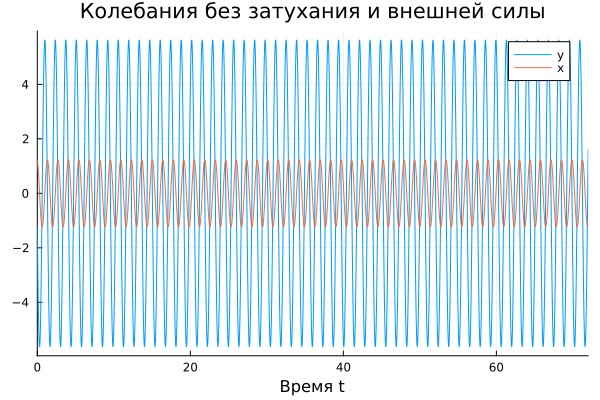

In [23]:
# Построение графиков для sol1
plot_oscillations(sol1, "Колебания без затухания и внешней силы")


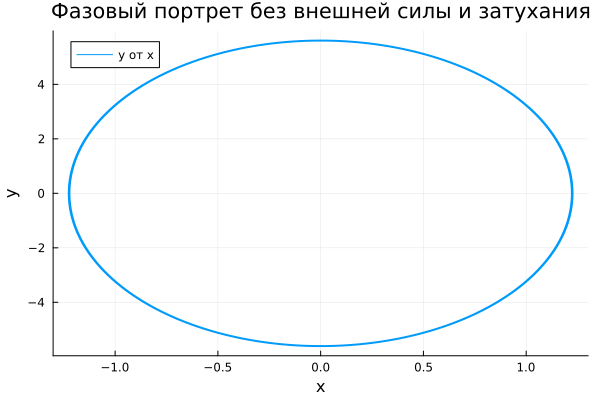

In [8]:
plot(sol1, vars=(2, 1), label="y от x", xlabel="x", ylabel="y", 
    title="Фазовый портрет без внешней силы и затухания")

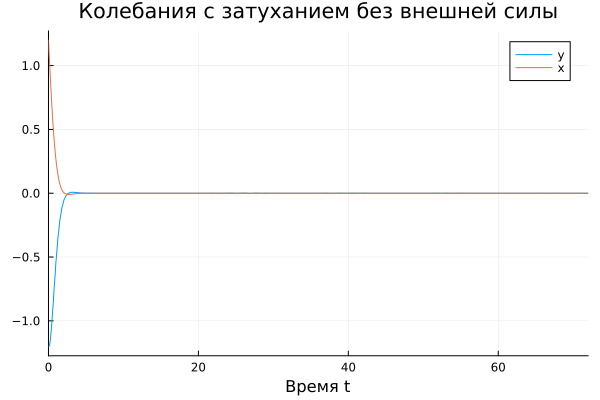

In [31]:
plot_oscillations(sol2, "Колебания с затуханием без внешней силы")

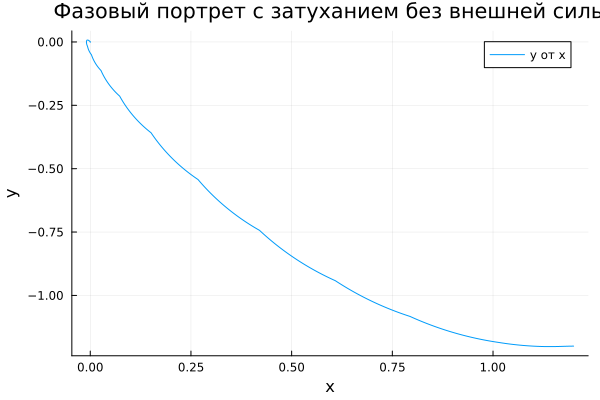

In [27]:
plot(sol2, vars=(2, 1), label="y от x", xlabel="x", ylabel="y", 
    title="Фазовый портрет с затуханием без внешней силы")

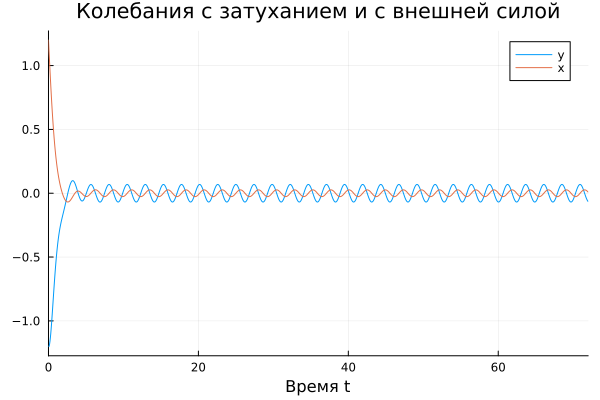

In [11]:
plot_oscillations(sol3, "Колебания с затуханием и с внешней силой")

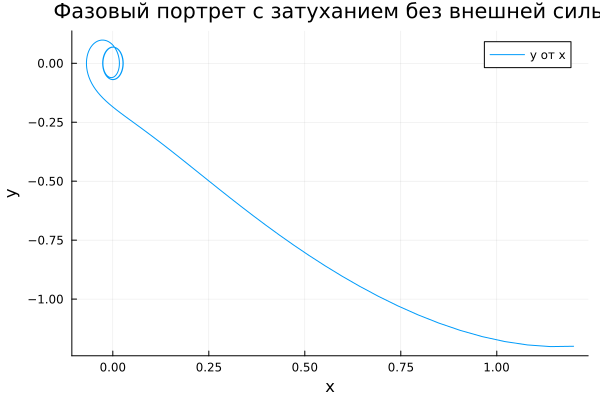

In [12]:
plot(sol3, vars=(2, 1), label="y от x", xlabel="x", ylabel="y", 
    title="Фазовый портрет с затуханием без внешней силы")

Openmodelica1

```Modelica
model lab4_1

Real x(start=1.2);
Real y(start=-1.2);

parameter Real w=21;
parameter Real g=0;

equation

der(x) = y;
der(y) = -w*x-g*y;

end lab4_1;
```

Openmodelica2

```Modelica
model lab4_2

Real x(start=1.2);
Real y(start=-1.2);

parameter Real w=2.3;
parameter Real g=2.2;

equation

der(x) = y;
der(y) = -w*x-g*y;

end lab4_2;
```

Openmodelica3

```Modelica
model lab4_3

Real x(start=1.2);
Real y(start=-1.2);

parameter Real w=2.5;
parameter Real g=2.4;
Real p;

equation

der(x) = y;
der(y) = -w*x-g*y+p;
p = 0.2*sin(2.6*time);

end lab4_3;
```

# Вопросы к лабораторной работе

1. Запишите простейшую модель гармонических колебаний

Простейшая модель гармонических колебаний описывается уравнением консервативного осциллятора:

$$
\ddot{x} + \omega_0^2 x = 0,
$$

где:
- $x$ — переменная, описывающая состояние системы (например, смещение грузика),
- $\omega_0$ — собственная частота колебаний,
- $\ddot{x} = \frac{\partial^2 x}{\partial t^2}$ — вторая производная по времени.


2. Дайте определение осциллятора

Осциллятор — это система, которая совершает колебания, то есть меняет своё состояние вблизи положения равновесия. В общем случае поведение осциллятора описывается дифференциальным уравнением второго порядка:

$$
\ddot{x} + 2\gamma\dot{x} + \omega_0^2 x = 0,
$$

где:

- $x$ — переменная состояния системы,
- $\gamma$ — параметр, характеризующий потери энергии (например, трение или сопротивление),
- $\omega_0$ — собственная частота колебаний,
- $\dot{x} = \frac{\partial x}{\partial t}$ и $\ddot{x} = \frac{\partial^2 x}{\partial t^2}$ — первая и вторая производные по времени.


3. Запишите модель математического маятника

Модель математического маятника является частным случаем гармонического осциллятора. Для малых углов отклонения $(\theta \ll 1)$ уравнение движения математического маятника записывается как:

$$
\ddot{\theta} + \frac{g}{l} \theta = 0,
$$

где:

- $\theta$ — угловое смещение маятника от вертикали,
- $g$ — ускорение свободного падения,
- $l$ — длина подвеса маятника,
- $\ddot{\theta} = \frac{\partial^2 \theta}{\partial t^2}$ — вторая производная углового смещения по времени.

Это уравнение можно переписать в стандартной форме гармонического осциллятора:

$$
\ddot{\theta} + \omega_0^2 \theta = 0,
$$

где $\omega_0 = \sqrt{\frac{g}{l}}$ — собственная частота колебаний маятника.


4. Запишите алгоритм перехода от дифференциального уравнения второго порядка к двум дифференциальным уравнениям первого порядка

- Введем новую переменную $y$, равную первой производной исходной переменной:

$$
y = \dot{x}.
$$

- Выразим вторую производную через новую переменную:

$$
\ddot{x} = \dot{y}.
$$

- Подставим эти выражения в исходное уравнение второго порядка. Например, для уравнения консервативного осциллятора:

$$
\ddot{x} + \omega_0^2 x = 0
$$

получаем:

$$
\dot{y} + \omega_0^2 x = 0.
$$

- Запишем систему из двух уравнений первого порядка:
  
$$
\begin{cases}
\dot{x} = y, \\
\dot{y} = -\omega_0^2 x.
\end{cases}
$$

5. Что такое фазовый портрет и фазовая траектория?


- **Фазовый портрет** — это графическое представление всех возможных состояний системы в фазовом пространстве (пространстве переменных состояния). Для осциллятора фазовое пространство обычно строится в координатах $(x, y)$, где $x$ — переменная состояния, а $y = \dot{x}$ — её скорость изменения.

- **Фазовая траектория** — это кривая в фазовом пространстве, описывающая изменение состояния системы во времени. Каждая точка на фазовой траектории соответствует определённому состоянию системы в заданный момент времени.

Для гармонического осциллятора фазовые траектории представляют собой замкнутые кривые (эллипсы), что указывает на периодический характер колебаний.
